In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set ()
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings ('ignore')

In [3]:
df = pd.read_csv ('downloads/breast-cancer-wisconsin-data.csv', sep = ',')
df.head ()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
print (df.shape)

(569, 33)


In [5]:
df.describe

<bound method NDFrame.describe of            id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0      842302         M        17.99         10.38          122.80     1001.0   
1      842517         M        20.57         17.77          132.90     1326.0   
2    84300903         M        19.69         21.25          130.00     1203.0   
3    84348301         M        11.42         20.38           77.58      386.1   
4    84358402         M        20.29         14.34          135.10     1297.0   
..        ...       ...          ...           ...             ...        ...   
564    926424         M        21.56         22.39          142.00     1479.0   
565    926682         M        20.13         28.25          131.20     1261.0   
566    926954         M        16.60         28.08          108.30      858.1   
567    927241         M        20.60         29.33          140.10     1265.0   
568     92751         B         7.76         24.54           47.92      181

In [6]:
df.describe ()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [7]:
df ['id'] = df ['id'].astype ('Int64')
df ['diag'] = 0
df ['diag'][df ['diagnosis'] == 'M'] = 1
del df ['Unnamed: 32']

In [8]:
df.describe ()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diag
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.372583
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,0.000000
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [9]:
df.info ()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
id                         569 non-null Int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

In [10]:
df.describe(percentiles=[.0001, .02, .1, .9, .98, .9999])

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diag
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.372583
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
0.01%,8.683802e+03,7.021328,9.748056,44.024584,145.027920,0.053191,0.019611,0.000000,0.000000,0.106608,...,12.046696,50.641744,187.381120,0.071743,0.027689,0.000000,0.000000,0.156506,0.055050,0.000000
2%,8.675720e+04,8.728880,12.188000,55.475200,232.124000,0.070126,0.035884,0.000000,0.000000,0.134936,...,15.663600,62.361600,278.768000,0.090878,0.054626,0.000000,0.000000,0.190136,0.059727,0.000000
10%,8.531554e+05,10.260000,14.078000,65.830000,321.600000,0.079654,0.049700,0.013686,0.011158,0.149580,...,17.800000,72.178000,384.720000,0.102960,0.093676,0.045652,0.038460,0.226120,0.065792,0.000000
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,0.000000
90%,8.814422e+07,19.530000,24.992000,129.100000,1177.400000,0.114820,0.175460,0.203040,0.100420,0.214940,...,33.646000,157.740000,1673.000000,0.161480,0.447840,0.571320,0.208940,0.360080,0.106320,1.000000
98%,9.196195e+07,22.794800,29.315600,152.100000,1625.360000,0.126724,0.240688,0.317528,0.150292,0.253188,...,39.275200,195.576000,2491.080000,0.185228,0.687424,0.783260,0.258652,0.467448,0.132388,1.000000


<class 'str'>
<class 'pandas.core.series.Series'>


(array([ 1.,  2.,  7., 18., 39., 52., 44., 21., 18., 10.]),
 array([0.02899 , 0.055191, 0.081392, 0.107593, 0.133794, 0.159995,
        0.186196, 0.212397, 0.238598, 0.264799, 0.291   ]),
 <a list of 10 Patch objects>)

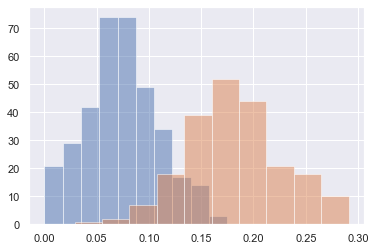

In [11]:
print (type (df.columns.values [29]))
print (type (df [df.columns.values [29]]))
plt.hist (df [df.columns.values [29]][df['diagnosis'] == 'B'], alpha = .5)
plt.hist (df [df.columns.values [29]][df['diagnosis'] == 'M'], alpha = .5)

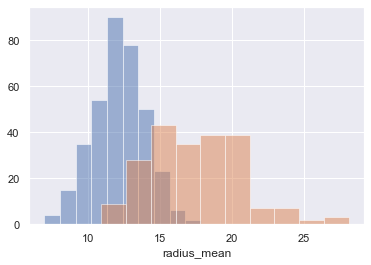

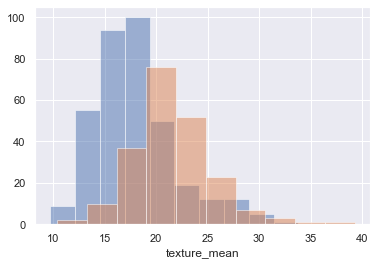

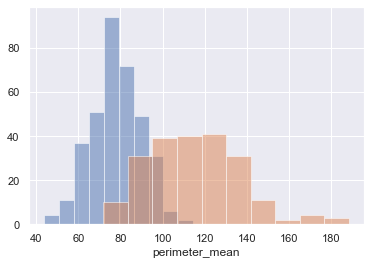

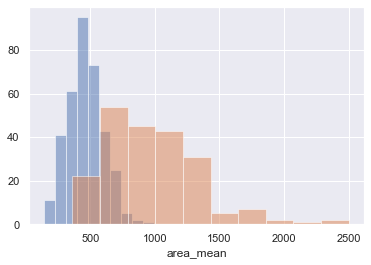

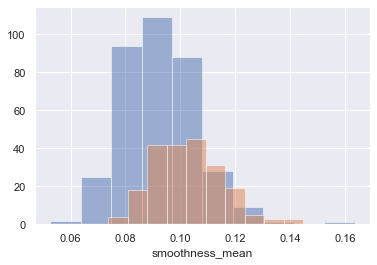

...

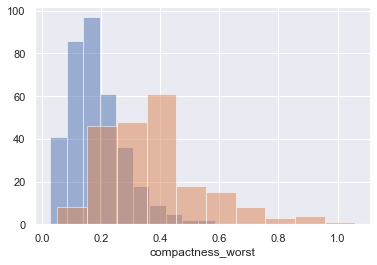

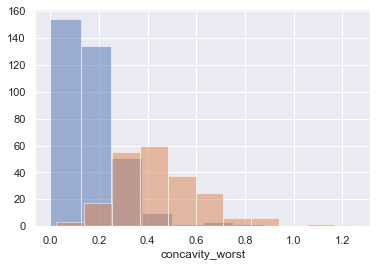

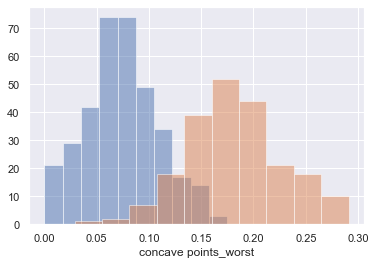

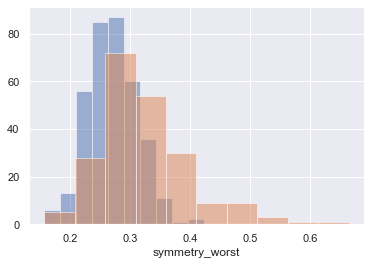

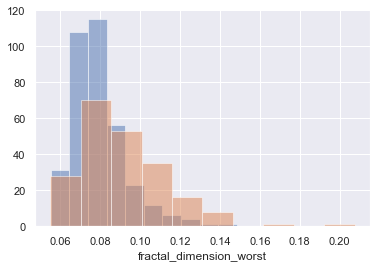

In [12]:
i = 2
k = df.columns.values.shape[0] - 1
while i < k:
    fp = plt.figure ()
    plt.xlabel (df.columns.values [i])
    plt.hist (df [df.columns.values [i]][df['diagnosis'] == 'B'], alpha = .5)
    plt.hist (df [df.columns.values [i]][df['diagnosis'] == 'M'], alpha = .5)
    i += 1

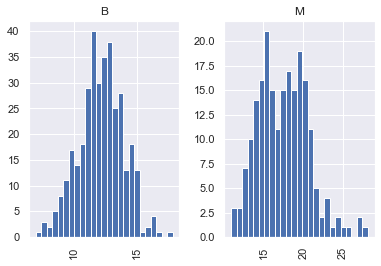

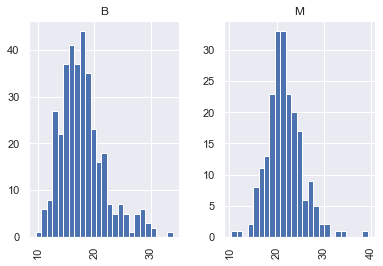

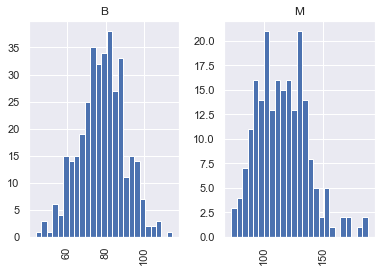

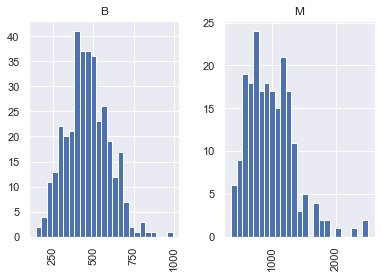

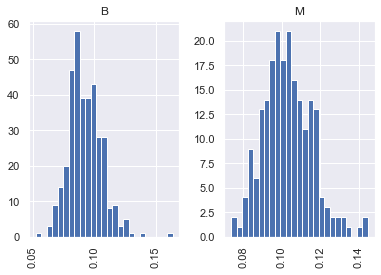

...

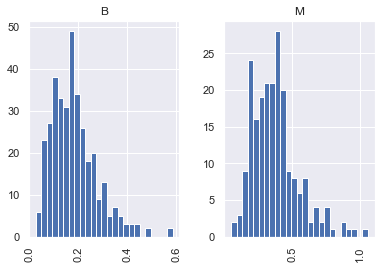

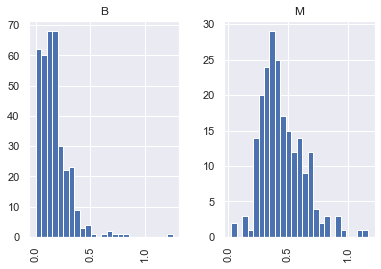

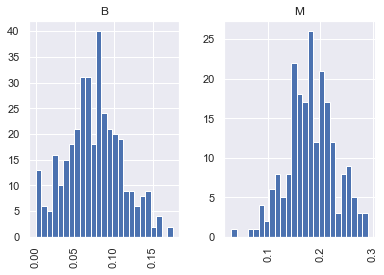

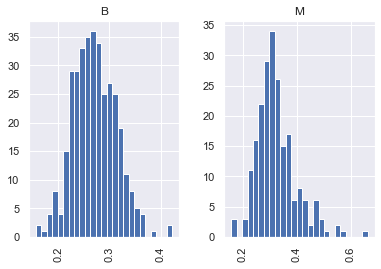

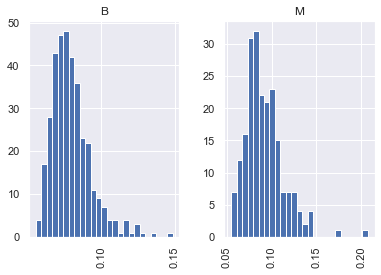

In [13]:
i = 2
k = df.columns.values.shape[0] - 1
while i < k: 
    df.hist (column = df.columns[i], bins = 25, by = df.columns [1])
    i += 1

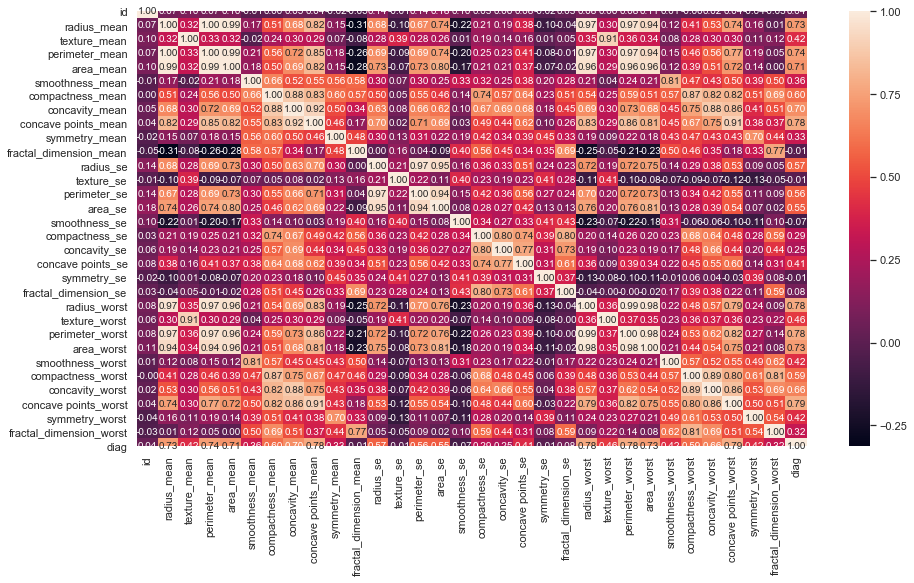

In [14]:
cr = df.corr ()
plt.figure (figsize = (15, 8));
sns.heatmap (cr, annot = True, fmt = '.2f');

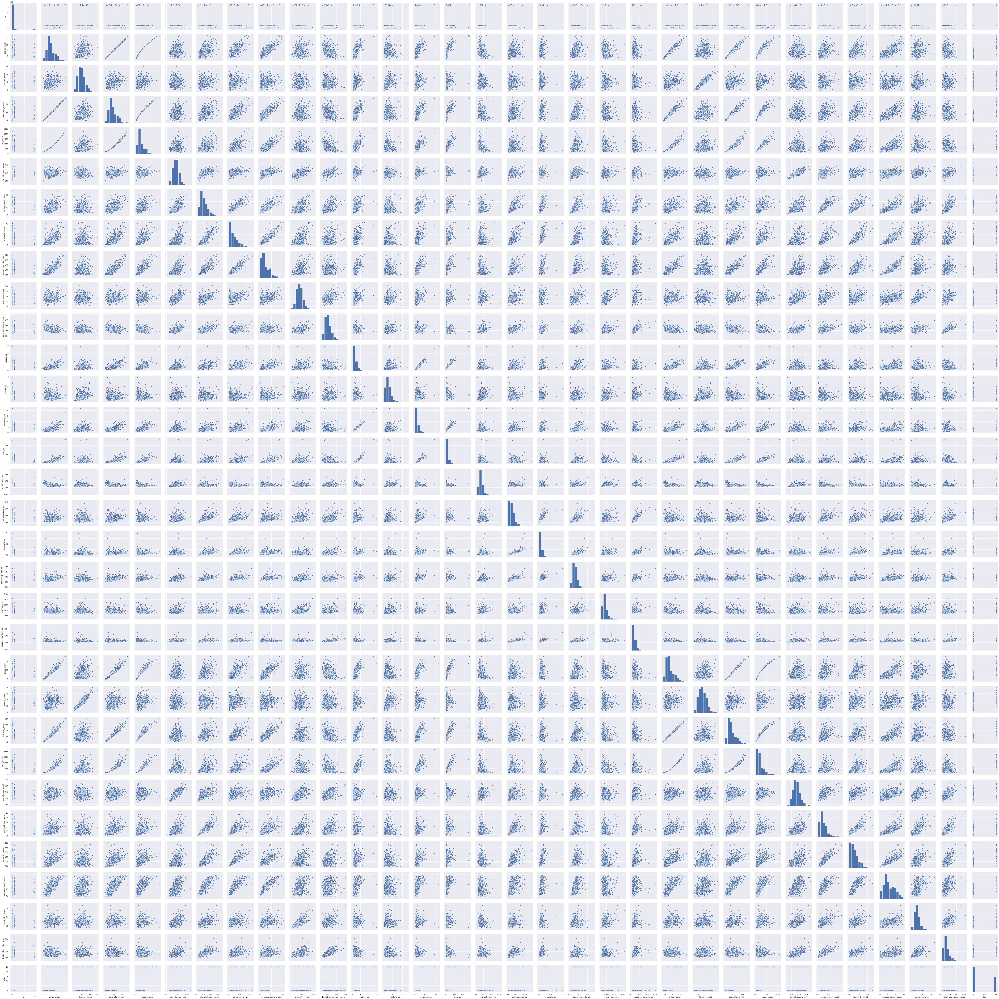

In [34]:
sns.pairplot (df)

In [58]:
'''
Выкинем все поля, дающие с полем concave_points_worst корреляцию выше 0.8
'''
df1 = df.drop (['compactness_mean', 'concavity_mean', 'concave points_mean', 'radius_worst', 'perimeter_worst',
                'area_worst', 'compactness_worst', 'concavity_worst', 'texture_mean', 'perimeter_se', 'area_se',
                'radius_mean', 'area_mean'], axis=1)

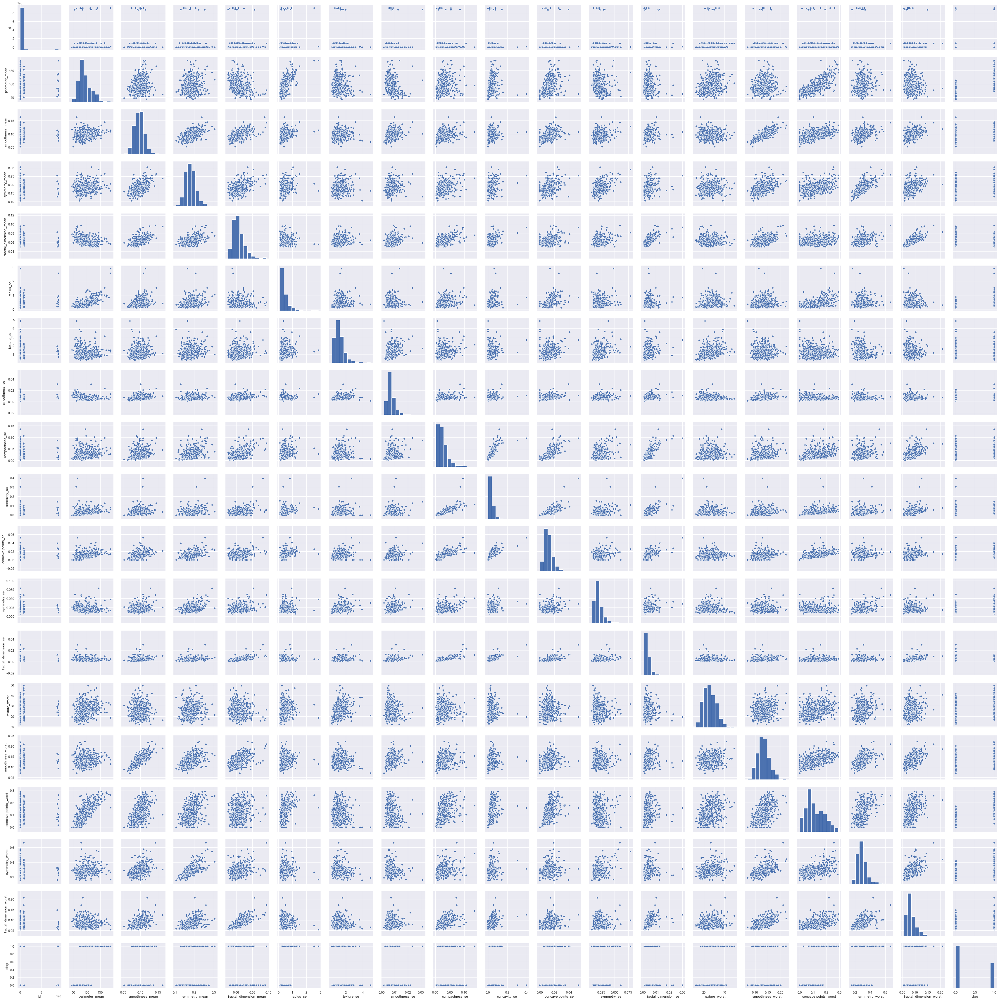

In [59]:
sns.pairplot (df1)

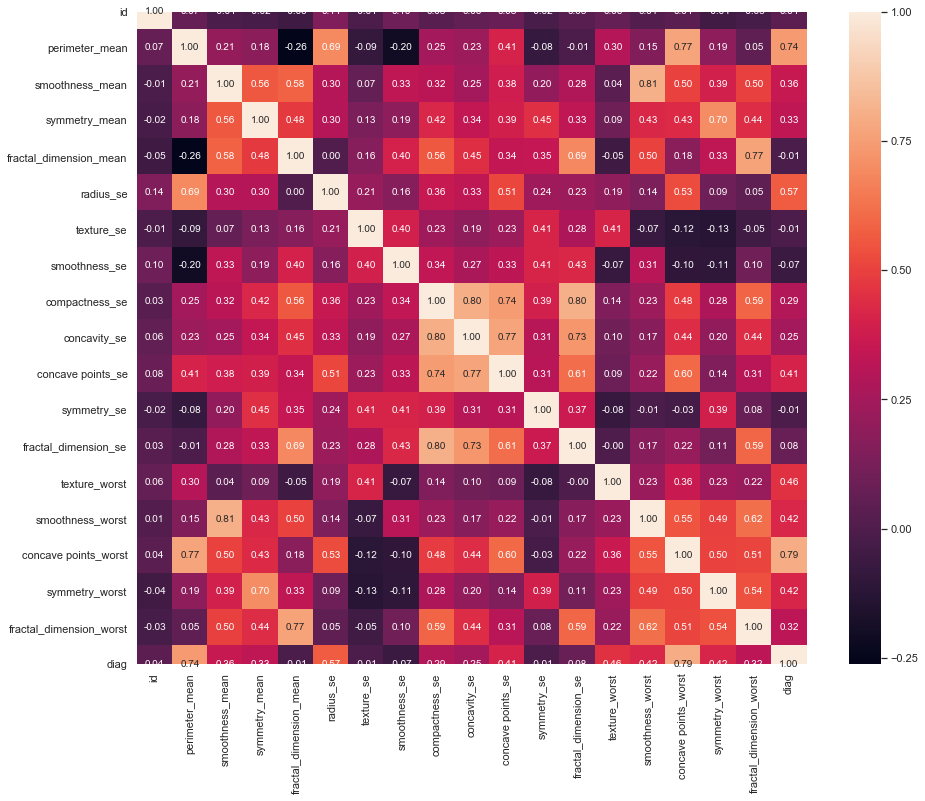

In [60]:
cr1 = df1.corr ()
plt.figure (figsize = (15, 12));
sns.heatmap (cr1, annot = True, fmt = '.2f');

In [61]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV

In [62]:
def quality_report(prediction, actual):
    print("Accuracy: {:.3f}\nPrecision: {:.3f}\nRecall: {:.3f}\nf1_score: {:.3f}".format(
        accuracy_score(prediction, actual),
        precision_score(prediction, actual),
        recall_score(prediction, actual),
        f1_score(prediction, actual)
    ))

In [63]:
X_train, X_test, y_train, y_test = train_test_split (df1.drop (['diagnosis', 'diag', 'id'], axis=1), df1 ['diag'], test_size = .3, random_state = 42, stratify = df1 ['diag'])

# стандартизируем
sc = StandardScaler ()

X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

In [65]:
log_reg = LogisticRegression (solver = 'lbfgs')

log_reg.fit (X_train_scaled, y_train)
print ("Train quality:")
quality_report (log_reg.predict (X_train_scaled), y_train)
print ("\nTest quality:")
quality_report (log_reg.predict (X_test_scaled), y_test)

Train quality:
Accuracy: 0.980
Precision: 0.959
Recall: 0.986
f1_score: 0.973

Test quality:
Accuracy: 0.982
Precision: 0.969
Recall: 0.984
f1_score: 0.976


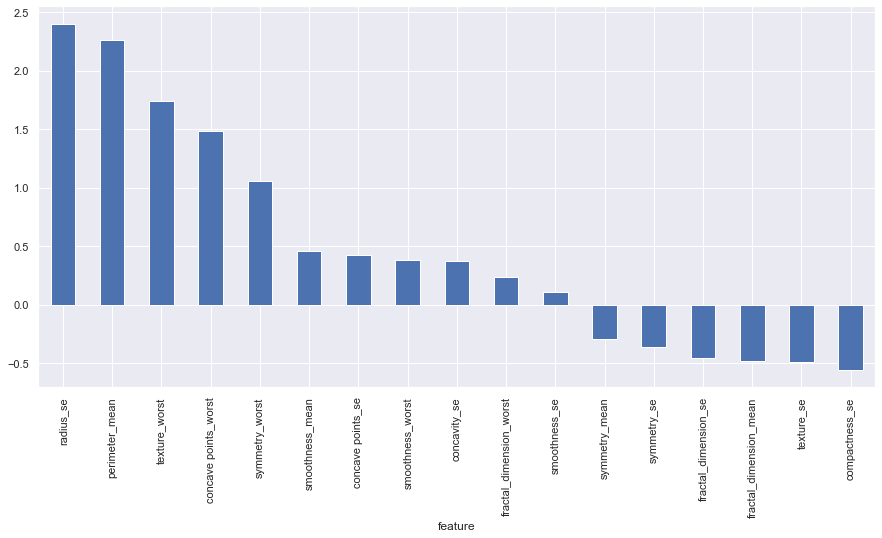

In [70]:
featureImportance = pd.DataFrame ({"feature": df1.drop (['diagnosis', 'diag', 'id'], axis = 1).columns,
                                   "importance": log_reg.coef_ [0]})
featureImportance.set_index ('feature', inplace = True)
featureImportance.sort_values (["importance"], ascending = False, inplace = True)
featureImportance ["importance"].plot ('bar', figsize = (15, 7));

In [76]:
from sklearn.metrics import roc_auc_score, roc_curve

def plot_roc_curve (prob_prediction, actual):
    fpr, tpr, thresholds = roc_curve (actual, prob_prediction)
    auc_score = roc_auc_score (actual, prob_prediction)
    plt.plot (fpr, tpr, label='ROC curve ')
    plt.plot ([0, 1], [0, 1])
    plt.xlim ([0.0, 1.0])
    plt.ylim ([0.0, 1.05])
    plt.xlabel ('False Positive Rate')
    plt.ylabel ('True Positive Rate')
    plt.title ('ROC AUC: {:.3f}'.format (auc_score))
    plt.show ()

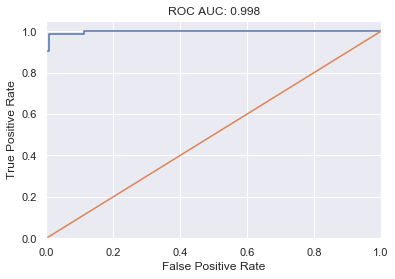

In [77]:
plot_roc_curve (log_reg.predict_proba (X_test_scaled)[:, 1], y_test)

In [87]:
log_reg_cv = LogisticRegressionCV (Cs = 100, solver = 'lbfgs')

log_reg_cv.fit (X_train_scaled, y_train)
print ("Train quality:")
quality_report (log_reg_cv.predict(X_train_scaled), y_train)
print ("\nTest quality:")
quality_report (log_reg_cv.predict(X_test_scaled), y_test)

Train quality:
Accuracy: 0.977
Precision: 0.946
Recall: 0.993
f1_score: 0.969

Test quality:
Accuracy: 0.977
Precision: 0.938
Recall: 1.000
f1_score: 0.968


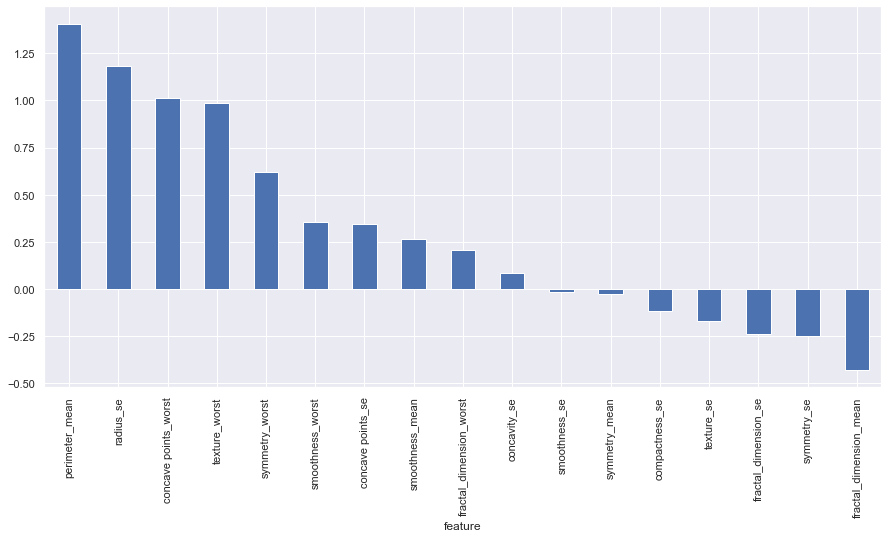

In [88]:
featureImportance = pd.DataFrame ({"feature": df1.drop (['diagnosis', 'diag', 'id'], axis = 1).columns,
                                   "importance": log_reg_cv.coef_ [0]})
featureImportance.set_index ('feature', inplace = True)
featureImportance.sort_values (["importance"], ascending = False, inplace = True)
featureImportance ["importance"].plot ('bar', figsize = (15, 7));

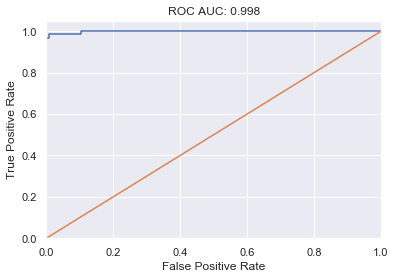

In [89]:
plot_roc_curve (log_reg_cv.predict_proba (X_test_scaled)[:, 1], y_test)

Train quality:
Accuracy: 0.952
Precision: 0.892
Recall: 0.978
f1_score: 0.933

Test quality:
Accuracy: 0.942
Precision: 0.859
Recall: 0.982
f1_score: 0.917


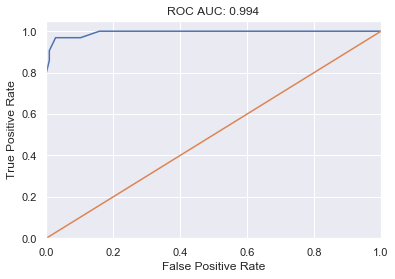

In [99]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier (n_neighbors = 15)
knn.fit (X_train_scaled, y_train)

print ("Train quality:")
quality_report (knn.predict (X_train_scaled), y_train)
print ("\nTest quality:")
quality_report (knn.predict (X_test_scaled), y_test)

plot_roc_curve (knn.predict_proba (X_test_scaled)[:, 1], y_test)

Train quality:
Accuracy: 0.940
Precision: 0.858
Recall: 0.977
f1_score: 0.914

Test quality:
Accuracy: 0.930
Precision: 0.812
Recall: 1.000
f1_score: 0.897


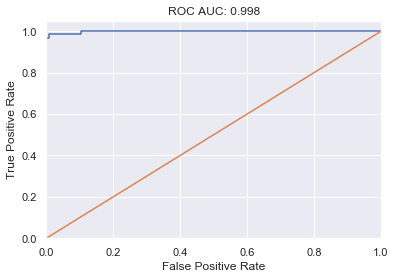

In [100]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier (n_neighbors = 35)
knn.fit (X_train_scaled, y_train)

print ("Train quality:")
quality_report (knn.predict (X_train_scaled), y_train)
print ("\nTest quality:")
quality_report (knn.predict (X_test_scaled), y_test)

plot_roc_curve (log_reg_cv.predict_proba (X_test_scaled)[:, 1], y_test)

Train quality:
Accuracy: 0.937
Precision: 0.838
Recall: 0.992
f1_score: 0.908

Test quality:
Accuracy: 0.936
Precision: 0.828
Recall: 1.000
f1_score: 0.906


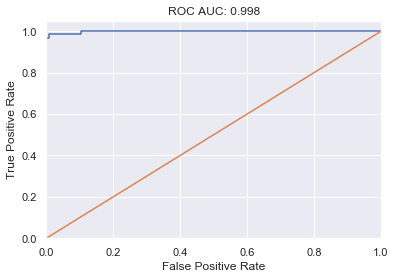

In [102]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier (n_neighbors = 45)
knn.fit (X_train_scaled, y_train)

print ("Train quality:")
quality_report (knn.predict (X_train_scaled), y_train)
print ("\nTest quality:")
quality_report (knn.predict (X_test_scaled), y_test)

plot_roc_curve (log_reg_cv.predict_proba (X_test_scaled)[:, 1], y_test)

Train quality:
Accuracy: 0.922
Precision: 0.804
Recall: 0.983
f1_score: 0.885

Test quality:
Accuracy: 0.930
Precision: 0.812
Recall: 1.000
f1_score: 0.897


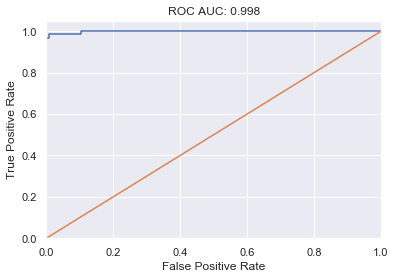

In [103]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier (n_neighbors = 75)
knn.fit (X_train_scaled, y_train)

print ("Train quality:")
quality_report (knn.predict (X_train_scaled), y_train)
print ("\nTest quality:")
quality_report (knn.predict (X_test_scaled), y_test)

plot_roc_curve (log_reg_cv.predict_proba (X_test_scaled)[:, 1], y_test)